In [25]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
image_files = "DataSet/page_01.jpg"
img = cv2.imread(image_files)

In [26]:
img

array([[[26, 26, 26],
        [26, 26, 26],
        [26, 26, 26],
        ...,
        [24, 22, 22],
        [25, 23, 23],
        [26, 24, 24]],

       [[27, 27, 27],
        [27, 27, 27],
        [27, 27, 27],
        ...,
        [26, 24, 24],
        [27, 25, 25],
        [28, 26, 26]],

       [[28, 28, 28],
        [28, 28, 28],
        [28, 28, 28],
        ...,
        [28, 26, 26],
        [29, 27, 27],
        [30, 28, 28]],

       ...,

       [[25, 25, 25],
        [25, 25, 25],
        [25, 25, 25],
        ...,
        [23, 23, 23],
        [23, 23, 23],
        [23, 23, 23]],

       [[25, 25, 25],
        [25, 25, 25],
        [25, 25, 25],
        ...,
        [24, 22, 22],
        [25, 23, 23],
        [26, 24, 24]],

       [[25, 25, 25],
        [25, 25, 25],
        [25, 25, 25],
        ...,
        [24, 22, 22],
        [25, 23, 23],
        [26, 24, 24]]], dtype=uint8)

In [27]:
cv2.imshow("Orginal_image",img)
cv2.waitKey(0)

-1

In [28]:
def display_image_in_actual_size(im_path):

    dpi = 80
    im_data = plt.imread(im_path)
    height, width, depth = im_data.shape

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()


In [29]:
def display_gray_image(im_path):

    dpi = 80
    im_data = plt.imread(im_path)
    height, width = im_data.shape

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()


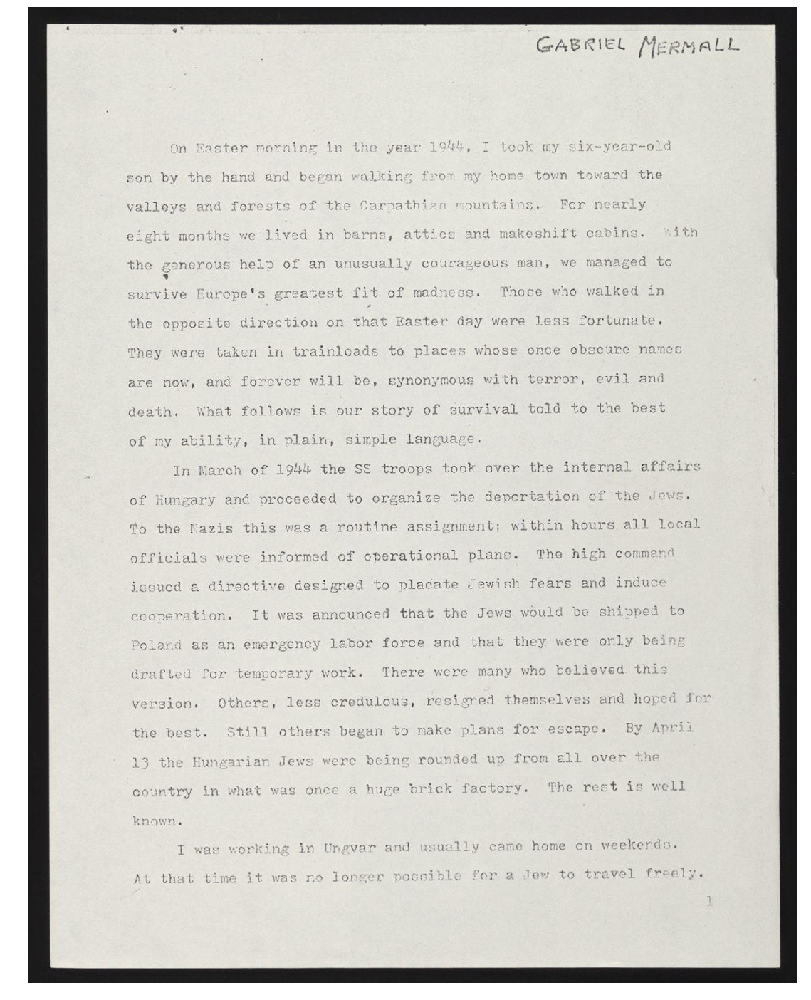

In [30]:
display_image_in_actual_size(image_files)

## INVERTED IMAGE

In [31]:
inverted_image = imagem = cv2.bitwise_not(img)
cv2.imwrite("temp/article_inverted.jpg",inverted_image)

True

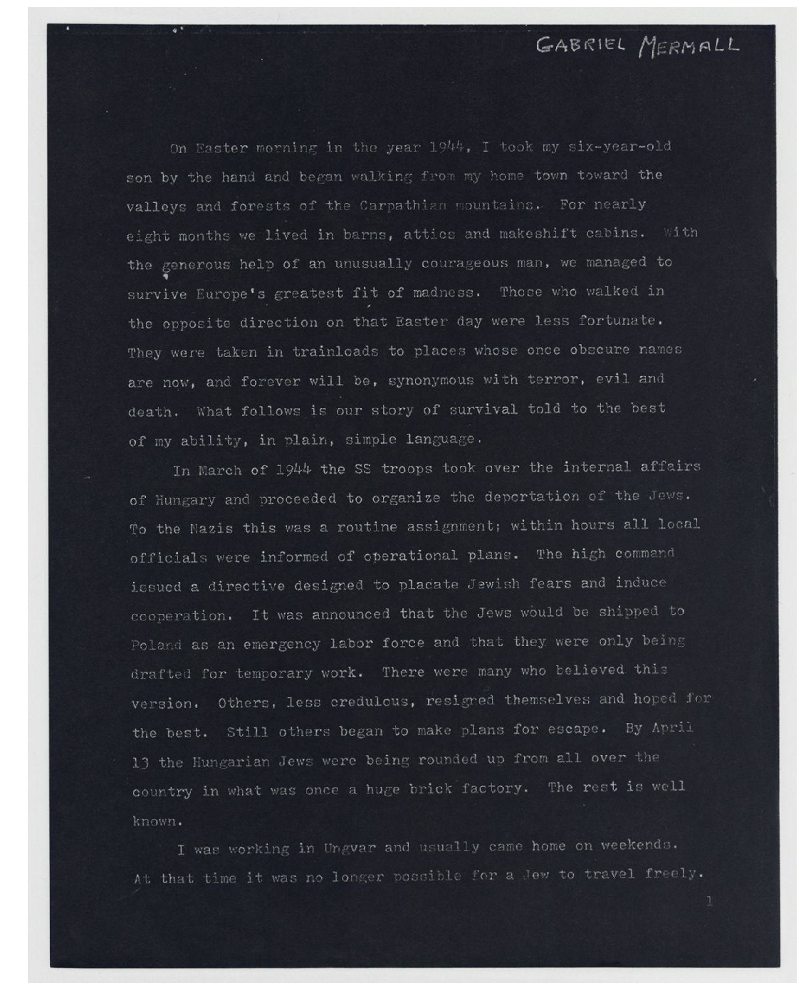

In [32]:
display_image_in_actual_size('temp/article_inverted.jpg')

## BINARIZATION

In [33]:
def greyScale(image):
    return cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

In [34]:
gray_image = greyScale(img)
cv2.imwrite("temp/gray1.jpg",gray_image)

True

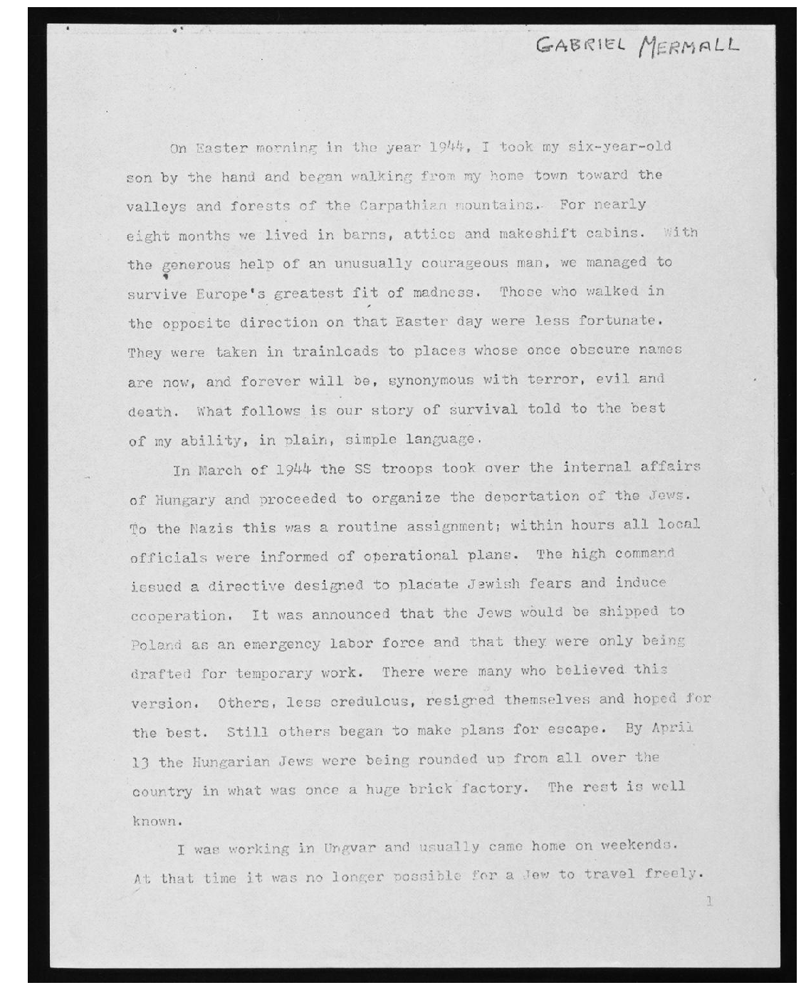

In [35]:
display_gray_image('temp/gray1.jpg')

In [36]:
thresh, im_bw = cv2.threshold(gray_image, 210, 230, cv2.THRESH_BINARY)
cv2.imwrite("temp/bw_image.jpg", im_bw)

True

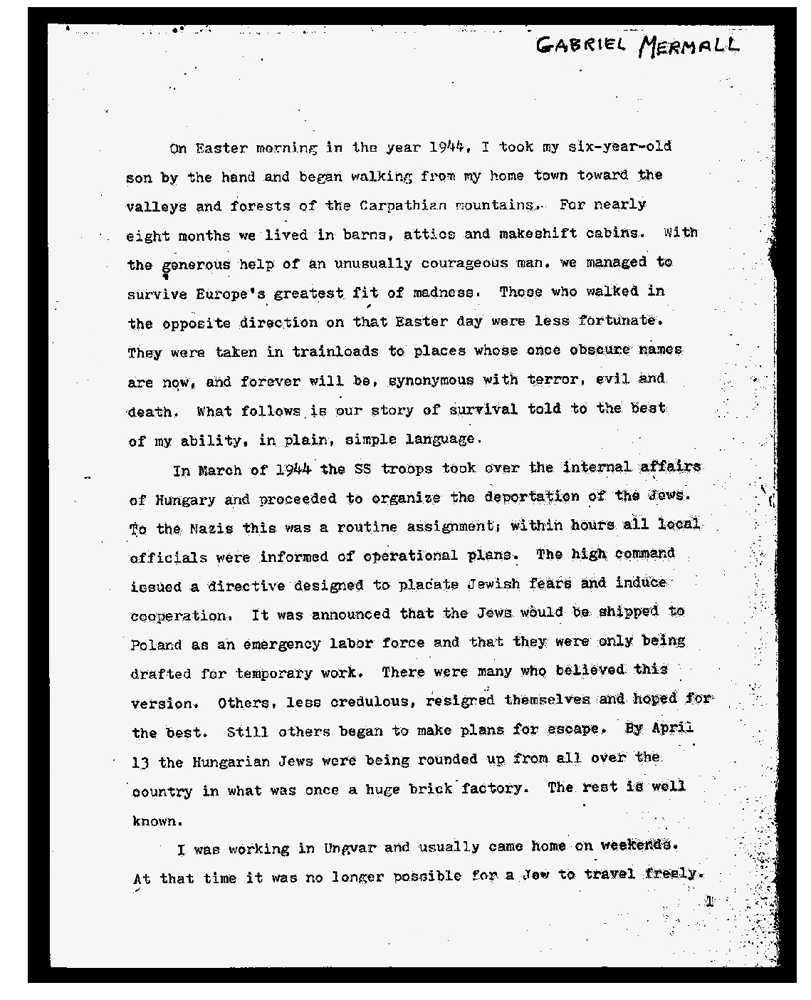

In [37]:
display_gray_image("temp/bw_image.jpg")

In [39]:
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return (image)

In [40]:
no_noise = noise_removal(im_bw)
cv2.imwrite("temp/no_noise.jpg", no_noise)

True

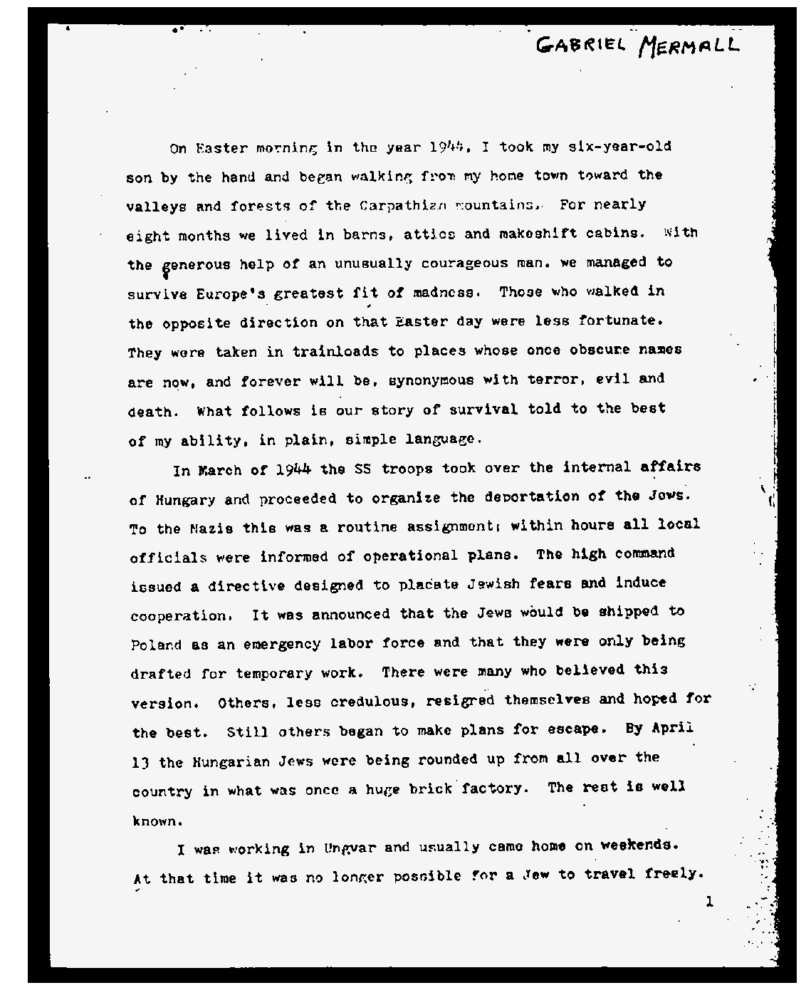

In [43]:
display_gray_image("temp/no_noise.jpg")

## Dilation and Erosion

In [44]:
def thin_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [45]:
eroded_image = thin_font(no_noise)
cv2.imwrite("temp/eroded_image.jpg", eroded_image)

True

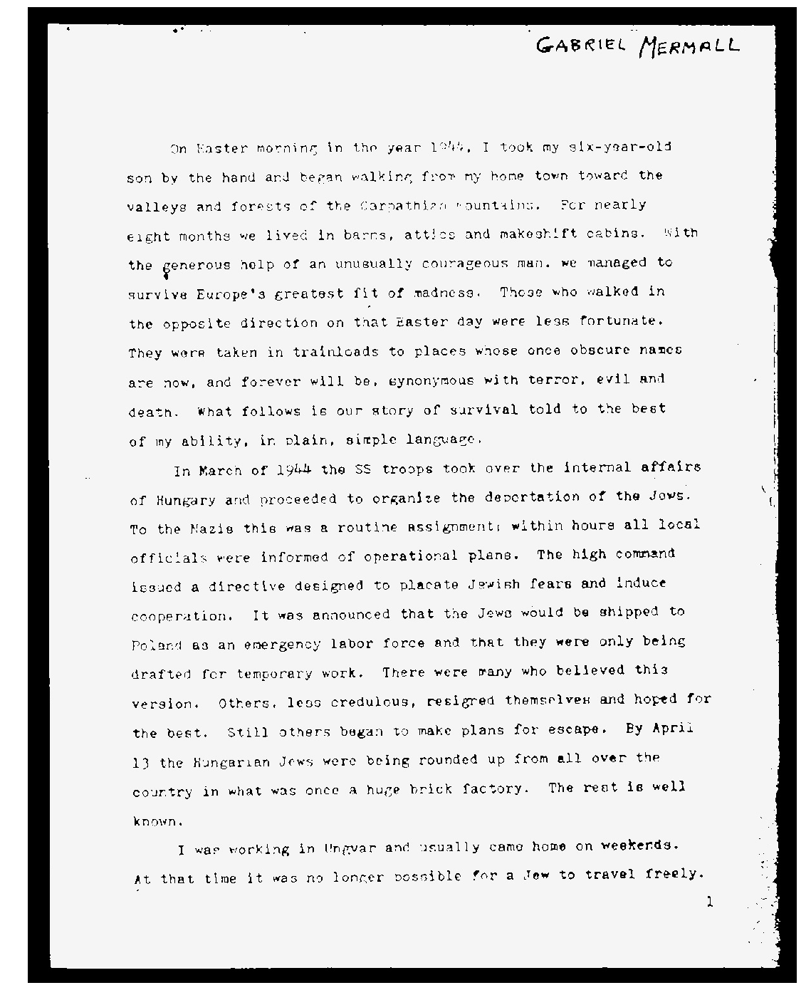

In [47]:
display_gray_image("temp/eroded_image.jpg")

In [48]:
def thick_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [49]:
dilated_image = thick_font(no_noise)
cv2.imwrite("temp/dilated_image.jpg", dilated_image)

True

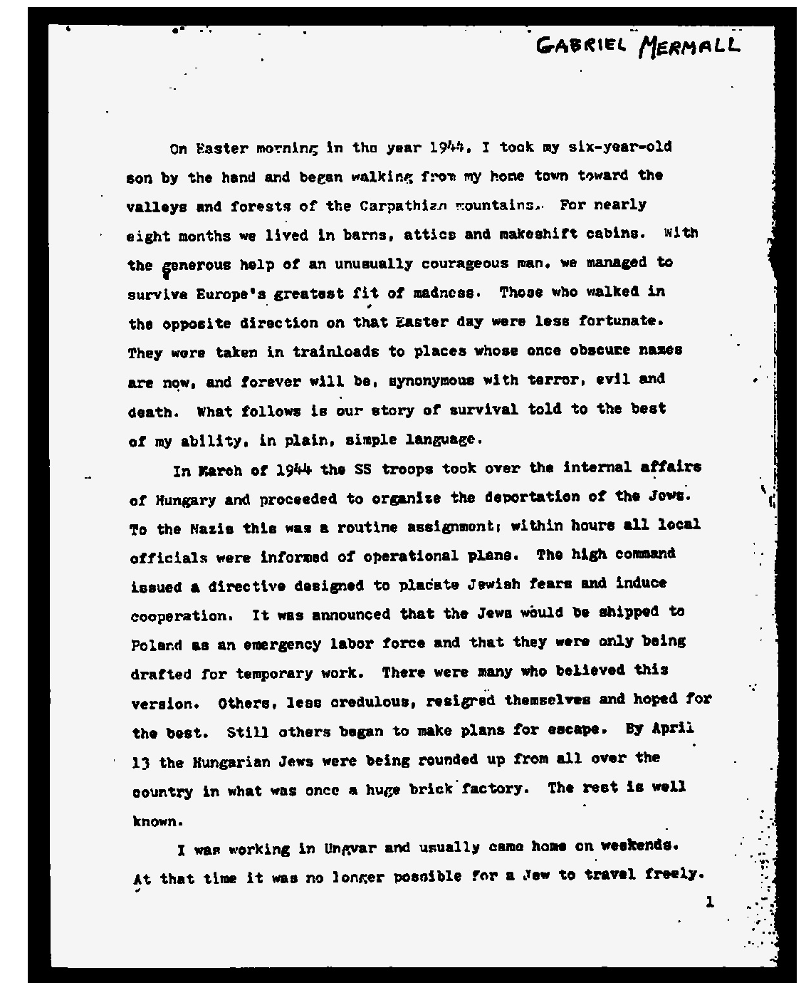

In [51]:
display_gray_image("temp/dilated_image.jpg")

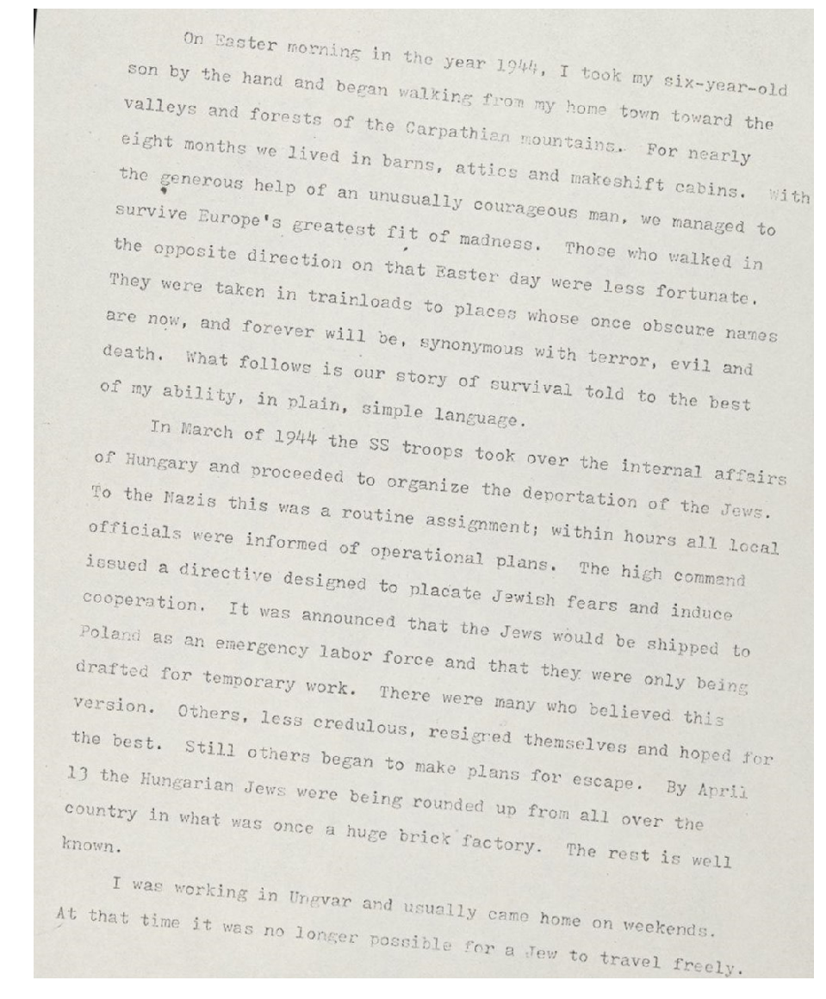

In [58]:
new = cv2.imread("DataSet/page_01_rotated.JPG")

display_image_in_actual_size("DataSet/page_01_rotated.JPG")

In [59]:
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [60]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [61]:
fixed = deskew(new)
cv2.imwrite("temp/rotated_fixed.jpg", fixed)

28


True

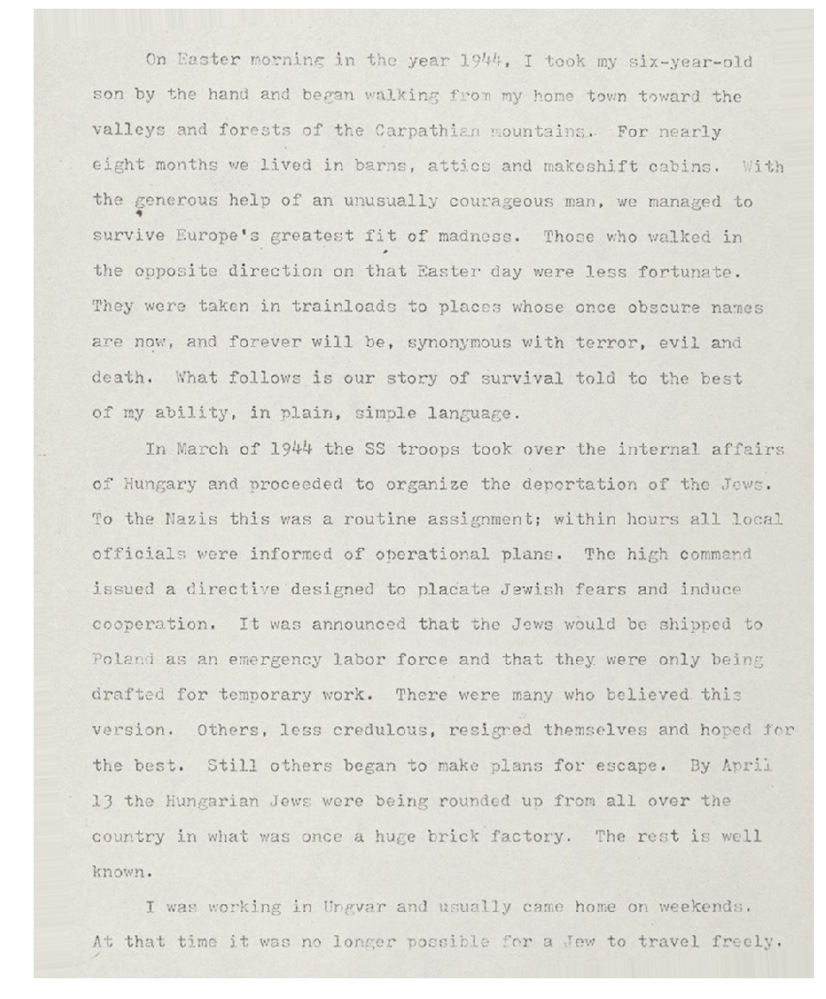

In [63]:
display_image_in_actual_size("temp/rotated_fixed.jpg")

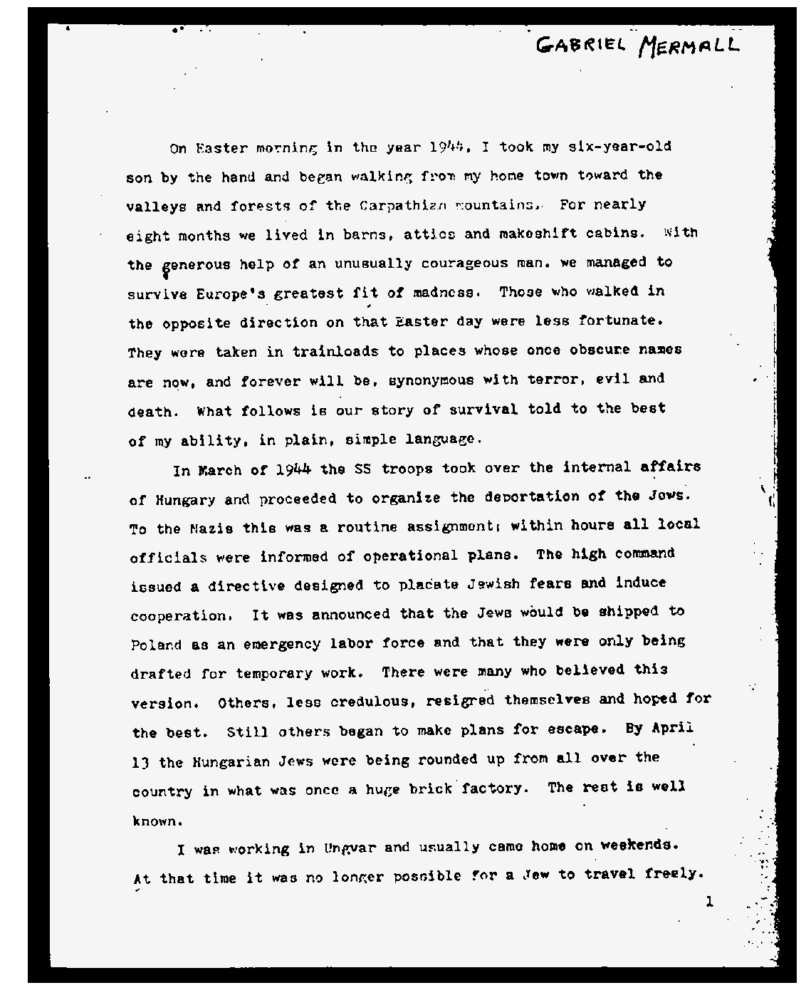

In [66]:
display_gray_image("temp/no_noise.jpg")

In [67]:
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

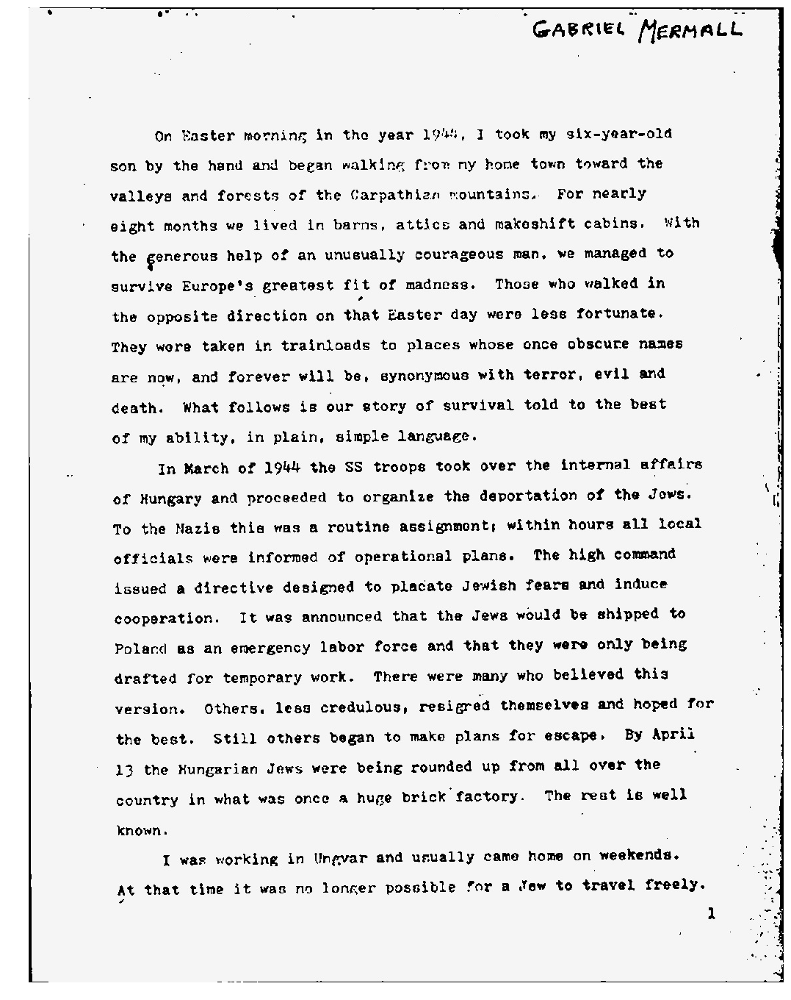

In [69]:
no_borders = remove_borders(no_noise)
cv2.imwrite("temp/no_borders.jpg", no_borders)
display_gray_image('temp/no_borders.jpg')

In [70]:
color = [255, 255, 255]
top, bottom, left, right = [150]*4

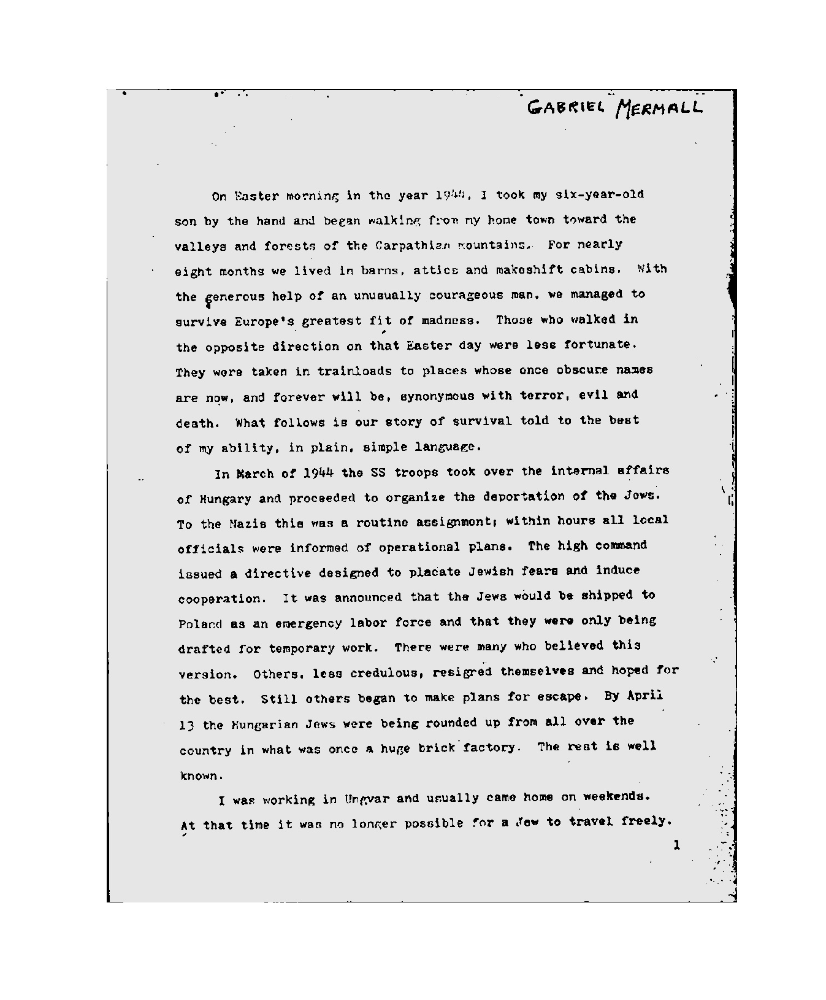

In [72]:
image_with_border = cv2.copyMakeBorder(no_borders, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
cv2.imwrite("temp/image_with_border.jpg", image_with_border)
display_gray_image("temp/image_with_border.jpg")